In [1]:
import warnings
from warnings import simplefilter
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=PendingDeprecationWarning)

In [2]:
import os
import rpy2
import logging
import warnings
import anndata2ri
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import decoupler as dc
import matplotlib.pyplot as plt
from gsva_prep import prep_gsva
import rpy2.robjects as robjects
from itertools import chain
from rpy2.robjects import pandas2ri
from matplotlib.pyplot import rcParams
from functions import helper_functions


In [3]:
# # Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

-----
anndata     0.11.1
scanpy      1.9.3
-----
PIL                         9.5.0
anndata2ri                  1.1
asttokens                   NA
backcall                    0.2.0
cffi                        1.15.1
comm                        0.1.3
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.6.7
decorator                   5.1.1
decoupler                   1.4.0
dot_parser                  NA
exceptiongroup              1.1.1
executing                   1.2.0
functions                   NA
google                      NA
gsva_prep                   NA
h5py                        3.9.0
igraph                      0.10.4
ipykernel                   6.23.2
ipywidgets                  8.0.6
jedi                        0.18.2
jinja2                      3.1.2
joblib                      1.2.0
kiwisolver                  1.4.4
leidenalg                   0.9.1
llvmlite                    0.39.1
louvain      

In [4]:
%%R

suppressPackageStartupMessages({
    library(Matrix)
    library(viridis)
    library(harmony)
    library(ggpubr)
    library(tictoc)
    library(RColorBrewer)
    library(Hmisc)
    library(corrplot)
    library(grid)
    library(gridExtra)
    library(igraph)
    library(ggrepel)
    library(readxl)
    library(conflicted)
    library(dplyr)
    library(parallel)
    library(stringr)
    library(tibble)
    library(BiocParallel)

    # single-cell analysis package
    library(Seurat)
    library(zellkonverter)   
    library(SingleCellExperiment)
    library(tidyr)
    library(readxl)
    library(GSA)
    library(limma)

    # plotting and data science packages
    library(tidyverse)
    library(cowplot)
    library(patchwork)
    library(ggplot2)

    # co-expression network analysis packages:
    library(WGCNA)
    library(hdWGCNA)

    # gene enrichment packages
    library(enrichR)
    library(GeneOverlap)
    library(GSEABase)
    library(GSVA) 

    # cell-cell communication
    library(nichenetr)

# needs to be run every time you start R and want to use %>%
})

# using the cowplot theme for ggplot
theme_set(theme_cowplot())

# set random seed for reproducibility
set.seed(12345)

# optionally enable multithreading
enableWGCNAThreads(nThreads = 40)


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    Allowing parallel execution with up to 40 working processes.


In addition: Warning messages:
1: replacing previous import ‘GenomicRanges::intersect’ by ‘SeuratObject::intersect’ when loading ‘hdWGCNA’ 
2: replacing previous import ‘GenomicRanges::union’ by ‘dplyr::union’ when loading ‘hdWGCNA’ 
3: replacing previous import ‘GenomicRanges::setdiff’ by ‘dplyr::setdiff’ when loading ‘hdWGCNA’ 
4: replacing previous import ‘dplyr::as_data_frame’ by ‘igraph::as_data_frame’ when loading ‘hdWGCNA’ 
5: replacing previous import ‘Seurat::components’ by ‘igraph::components’ when loading ‘hdWGCNA’ 
6: replacing previous import ‘dplyr::groups’ by ‘igraph::groups’ when loading ‘hdWGCNA’ 
7: replacing previous import ‘dplyr::union’ by ‘igraph::union’ when loading ‘hdWGCNA’ 
8: replacing previous import ‘GenomicRanges::subtract’ by ‘magrittr::subtract’ when loading ‘hdWGCNA’ 
9: replacing previous import ‘Matrix::as.matrix’ by ‘proxy::as.matrix’ when loading ‘hdWGCNA’ 
10: replacing previous import ‘igraph::groups’ by ‘tidygraph::groups’ when loading ‘hdWGCNA’ 

## **Data Prep Parameters**

- `test_names`: List of the different test names of interest.

- `save_prefix`: Preferred prefix for saving critical files. Ideally chosen to be in the format `{source name}_{brain region}`. e.g `mathys_pfc`

- `subject_id`: Column name for Subject/Patient ID in both metadata and `.obs`

In [11]:
save_prefix = 'seaad_mtg'                                       # this takes the format '{StudyName}_{ThreeLetterAccronymForBrainRegion}'
subject_id = helper_functions.clean_strings('Donor ID')
cell_type_column = 'Subclass'                       # 'Supertype (non-expanded)', 'Subclass'
pseudobulk_level = 'Supertype'                      # Level at which cells are aggregated into pseudobulks,
factor = 'Continuous Pseudo-progression Score'    # pathology.group # Continuous Pseudoprogression Score
factor = helper_functions.clean_strings(factor, replace_hyphen=True)
test_names = ['late_vs_early']                                  # test categories
region_name = save_prefix.split('_')[-1].upper()
count_agg_strategy = 'metacell'   # options 'network', 'random', 'pseudobulk', 'smaller_network', 'standardbulk', 'metacell', `blanchardbulk``


data_dir = f'/media/tadeoye/Volume1/data/seq/SEA-AD/{region_name}/RNAseq/'
save_dir = f'../results/'

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

subclass = {
    'excitatory': ['L5 IT', 'L2/3 IT', 'L4 IT', 'L6 IT', 'L6 IT Car3', 'L5/6 NP', 'L6b', 'L6 CT', 'L5 ET'],
    'inhibitory': ['Pvalb', 'Sst', 'Lamp5 Lhx6', 'Vip', 'Lamp5', 'Sncg', 'Chandelier', 'Sst Chodl', 'Pax6'],
    'astrocyte': ['Astrocyte'],
    'microglia': ['Microglia-PVM'],
    'opc': ['OPC'],
    'oligodendrocyte': ['Oligodendrocyte'],
    'endothelial': ['Endothelial'],
    'vlmc': ['VLMC'],
    }

cell_supertypes = list(chain(*list(subclass.values())))



# **Load Merged Pseudo-bulked Data**

We have merged the pseduobulked data for all cell sypertypes (`02_merge_pseudobulks.ipynb`). Now, we load the merged data.

In [6]:
clean_subclass = robjects.ListVector({k: [helper_functions.clean_strings(v, preserve_case=True) for v in val] for k, val in subclass.items()})
clean_cell_supertypes = [helper_functions.clean_strings(cell_type, preserve_case=True) for cell_type in cell_supertypes]

In [7]:
adata_merged = sc.read_h5ad(data_dir+f'counts/anndata/all_subclass_{count_agg_strategy}_anndata.h5ad')
adata_merged.X = csr_matrix(adata_merged.X)

adata_annot = sc.read_h5ad(os.path.join(data_dir, f'counts/anndata/{save_prefix.upper()}_RNAseq_final-nuclei.2024-02-13.h5ad'))
adata_annot.X = adata_annot.layers['UMIs'] 

Subclass = robjects.ListVector(subclass)

In [8]:
%%R -i adata_merged -i count_agg_strategy -i data_dir -i subject_id -i Subclass -i cell_supertypes -i clean_cell_supertypes -i clean_subclass

source('../scripts/functions/helper_functions.r')

print('Merged data loaded')
adata_merged

[1] "Merged data loaded"
class: SingleCellExperiment 
dim: 36601 111258 
metadata(0):
assays(2): X logcounts
rownames(36601): MIR1302-2HG FAM138A ... AC007325.4 AC007325.2
rowData names(0):
colnames(111258): L5 IT_1#H19.33.004_1 L5 IT_1#H19.33.004_2 ...
  VLMC_1#H21.33.027_5 VLMC_1#H21.33.027_6
colData names(21): donor_id orig.ident ... pseudo_genes_detected
  pseudo_number_of_umis
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):


In [9]:
# del adata_merged, summed_counts_per_celltype

In [13]:
n_cores = 40

covariates = [
    'Continuous Pseudo-progression Score',
    'Age at Death binned codes',
    'Sex',
    'APOE4_Status',
    'Pseudo Genes Detected',
    'Pseudo Number of UMIs',
    # 'PMI',
    'method',
    'Race (choice=White)',
]

covariates = helper_functions.clean_strings(covariates, replace_hyphen=True)

In [20]:
import os
import warnings
from datetime import datetime
from scipy.sparse import csr_matrix
from joblib import Parallel, delayed
from functions.run_nebula import run_de_tests, build_effect_size_anndata, get_standardized_effects


warnings.filterwarnings('ignore', category=FutureWarning, module='anndata')
warnings.filterwarnings('ignore', message='.*reticulate.*')


# Set up parameters
params = {
    'region': 'MTG',
    'target': '',
    'split_key': pseudobulk_level,
    'outgroup_de': False, 
    'outgroup': '', 
    'covariates': covariates,
    'random_effect': subject_id,
    'covariate_formula': ' + '.join(covariates[1:]) + " + ",
    'tests': [factor],
    'layer': 'X',  
    'offset_variable': helper_functions.clean_strings('Pseudo Number of UMIs'),
    'group_cell': False,
    'save_dir': data_dir+'results/differential_gene_expression'  
}

adata_merged.obs[params['split_key']] = adata_merged.obs[params['split_key']].astype('category')

os.makedirs(params['save_dir'], exist_ok=True)

def process_target(target, adata_merged, params, cell_type_column):
    adata = adata_merged[adata_merged.obs[cell_type_column] == target]
    results = []
    for b in adata.obs[params['split_key']].cat.categories:
        try:
            result = run_de_tests(
                adata_merged,
                params['region'],
                helper_functions.clean_strings(target,preserve_case=True,replace_hyphen=False),
                params['split_key'],
                params['outgroup_de'],
                b,
                params['covariates'],
                params['random_effect'],
                params['covariate_formula'],
                params['tests'],
                params['layer'],
                params['offset_variable'],
                params['group_cell'],
                params['save_dir']
            )
            results.append(result)
        except Exception as e:
            error_msg = str(e)
            if "Some predictors have zero variation or a zero vector" in error_msg:
                print(f"{datetime.now()} -- Skipping {b} because some predictors have zero variation or a zero vector")
            else:
                print(f"{datetime.now()} -- Error processing {b}: {str(e)}") 
            continue
            
    return results

# Parallelize at target level
targets = adata_merged.obs[cell_type_column].unique()
results = Parallel(n_jobs=n_cores)(
    delayed(process_target)(target, adata_merged, params, cell_type_column) 
    for target in targets
)

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:27:48.718252 -- No outgroup specified, running analysis for all groups and tests

    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/tadeoye/miniconda3/envs/

2025-01-21 13:27:50.040343 -- No outgroup specified, running analysis for all groups and tests

    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    2025-01-21 13:27:50.713590 -- Removing 3697 features from L5_IT_1 for low numbers of counts per cell
2025-01-21 13:27:50.848823 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:50.850709 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:27:50.909977 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 1476 genes in L5_IT_1 because all values are 0 for that covariate


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:27:51.736980 -- No outgroup specified, running analysis for all groups and tests

    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    2025-01-21 13:27:52.565351 -- Removing 4218 features from L4_IT_1 for low numbers of counts per cell
2025-01-21 13:27:52.706466 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:52.707825 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:27:52.759539 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 885 genes in L4_IT_1 because all values are 0 for that covariate


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:27:53.079388 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:27:53.134722 -- Removing 7505 features from L6_IT_Car3_1 for low numbers of counts per cell
2025-01-21 13:27:53.143022 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:53.159398 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.0 for 4357 genes in L6_IT_Car3_1 because all values are 0 for that covariate

    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    2025-01-21 13:27:54.342556 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:27:54.707096 -- Removing 4471 features from L5_6_NP_1 for low numbers of counts per cell
2025-01-21 13:27:54.739760 -- Removing 4169 features from L6_IT_1 for low numbers of counts per cell
2025-01-21 13:27:54.766883 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:54.768220 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:27:54.798369 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:54.800265 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:27:54.799585 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 2053 genes in L5_6_NP_1 because all values are 0 for that covariate
2025-01-21 13:27:54.834197 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 1528 genes in L6_IT_1 because all values

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:27:56.936526 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:27:57.198544 -- Removing 5968 features from Pvalb_1 for low numbers of counts per cell
2025-01-21 13:27:57.243447 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:57.292248 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.8095932638239676 for 2905 genes in Pvalb_1 because all values are 0 for that covariate


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:27:57.775866 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:27:57.900479 -- Removing 4622 features from L6_CT_1 for low numbers of counts per cell
2025-01-21 13:27:57.915561 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:57.916952 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:27:57.935106 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 2299 genes in L6_CT_1 because all values are 0 for that covariate


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:27:58.238245 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:27:58.279042 -- Removing 11698 features from L6b_2 for low numbers of counts per cell
2025-01-21 13:27:58.282031 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:58.282619 -- Removing continuous_pseudo_progression_score from the covariate formula
2025-01-21 13:27:58.283791 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:27:58.284199 -- Removing age_at_death_binned_codes from the covariate formula
2025-01-21 13:27:58.284741 -- Removing sex from the covariate formula
2025-01-21 13:27:58.285022 -- Removing apoe4_status from the covariate formula
2025-01-21 13:27:58.286112 -- Detected pseudo_genes_detected as an integer or float, applying a min-max normalization
2025-01-21 13:27:58.299699 -- Adding 3 pseudocounts to pseudo_genes_detected=0.0 for 5399 

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:27:59.504843 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:27:59.533555 -- Removing 16021 features from Sst_2 for low numbers of counts per cell
2025-01-21 13:27:59.536573 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:27:59.536959 -- Removing continuous_pseudo_progression_score from the covariate formula
2025-01-21 13:27:59.537990 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:27:59.538230 -- Removing age_at_death_binned_codes from the covariate formula
2025-01-21 13:27:59.538592 -- Removing sex from the covariate formula
2025-01-21 13:27:59.538835 -- Removing apoe4_status from the covariate formula
2025-01-21 13:27:59.539876 -- Detected pseudo_genes_detected as an integer or float, applying a min-max normalization
2025-01-21 13:27:59.553788 -- Adding 3 pseudocounts to pseudo_genes_detected=0.25402278069

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:00.520167 -- No outgroup specified, running analysis for all groups and tests


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:00.922758 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:01.299262 -- Removing 5228 features from Vip_1 for low numbers of counts per cell
2025-01-21 13:28:01.366303 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:01.367593 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:28:01.393096 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 1636 genes in Vip_1 because all values are 0 for that covariate
2025-01-21 13:28:01.501952 -- Removing 4728 features from Lamp5_Lhx6_1 for low numbers of counts per cell
2025-01-21 13:28:01.702774 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:01.704348 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:28:01.780744 -- Adding 3

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:02.880584 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:02.913042 -- Removing 11945 features from Sncg_1 for low numbers of counts per cell
2025-01-21 13:28:02.916973 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:02.930314 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.7107407372495411 for 5044 genes in Sncg_1 because all values are 0 for that covariate
2025-01-21 13:28:03.065324 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:03.112941 -- Removing 10503 features from Lamp5_1 for low numbers of counts per cell
2025-01-21 13:28:03.117155 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:03.131686 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.0 for 7536 genes in Lamp5_1 because all values are 0 for that covariate

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:03.616681 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:03.691375 -- Removing 8227 features from Pax6_1 for low numbers of counts per cell
2025-01-21 13:28:03.700126 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:03.716642 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.103825014087543 for 7178 genes in Pax6_1 because all values are 0 for that covariate


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:05.181442 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:05.370962 -- Removing 6615 features from Chandelier_1 for low numbers of counts per cell
2025-01-21 13:28:05.393980 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:05.395264 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:28:05.414968 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 2566 genes in Chandelier_1 because all values are 0 for that covariate


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:08.068388 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:08.267820 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:08.300938 -- Removing 19813 features from Endo_2 for low numbers of counts per cell
2025-01-21 13:28:08.303917 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:08.304327 -- Removing continuous_pseudo_progression_score from the covariate formula
2025-01-21 13:28:08.305423 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:28:08.305662 -- Removing age_at_death_binned_codes from the covariate formula
2025-01-21 13:28:08.306013 -- Removing sex from the covariate formula
2025-01-21 13:28:08.306230 -- Removing apoe4_status from the covariate formula
2025-01-21 13:28:08.307325 -- Detected pseudo_genes_detected as an integer or float, applying a min-max normaliz

R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:09.082551 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.2331134537922132 for 2817 genes in VLMC_1 because all values are 0 for that covariate
2025-01-21 13:28:12.906560 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:12.908974 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:28:13.717519 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 9 genes in L2_3_IT_1 because all values are 0 for that covariate


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:14.710580 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:14.897154 -- Removing 6155 features from Astro_1 for low numbers of counts per cell


R[write to console]: here() starts at /home/tadeoye/Documents/research_codes/cell_cell_communication



2025-01-21 13:28:14.927143 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:14.928847 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:28:14.932982 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:28:14.969681 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 1963 genes in Astro_1 because all values are 0 for that covariate
2025-01-21 13:28:16.848134 -- Removing 5840 features from OPC_2 for low numbers of counts per cell
2025-01-21 13:28:17.230761 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:28:17.232653 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:28:17.372132 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 444 genes in OPC_2 because all values are 0 for that

R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 13:31:10.046384 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.0 for 3075 genes in Sncg_1 because all values are 0 for that covariate
2025-01-21 13:31:26.951521 -- Detected pseudo_number_of_umis as an integer or float, applying a min-max normalization
2025-01-21 13:31:26.991080 -- Removing method from the covariate formula
2025-01-21 13:31:26.991195 -- Removing race_choice_white from the covariate formula
2025-01-21 13:31:27.032148 -- Starting Sst_2 across continuous_pseudo_progression_score
The cells are already grouped.2025-01-21 13:31:27.098640 -- Skipping Sst_2 because some predictors have zero variation or a zero vector


R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 13:31:28.230507 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:31:28.532481 -- Removing 5772 features from Sst_3 for low numbers of counts per cell
2025-01-21 13:31:28.583692 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:31:28.585210 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:31:28.612314 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 1686 genes in Sst_3 because all values are 0 for that covariate
2025-01-21 13:31:32.941771 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.3327136446937277 for 8447 genes in Lamp5_1 because all values are 0 for that covariate
2025-01-21 13:31:38.433136 -- Detected pseudo_number_of_umis as an integer or float, applying a min-max normalization
2025-01-21 13:31:38.474615 -- Removing method from the covariate formula
2025-01-21 13:31:38.474744 

R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 13:31:40.349449 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 13:31:40.613446 -- Removing 4321 features from L6b_6 for low numbers of counts per cell
2025-01-21 13:31:40.655458 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 13:31:40.657016 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:31:40.692940 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.0 for 1113 genes in L6b_6 because all values are 0 for that covariate
2025-01-21 13:32:16.497030 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.0 for 36 genes in L2_3_IT_1 because all values are 0 for that covariate
2025-01-21 13:32:23.621066 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 13:32:23.719479 -- Detected pseudo_genes_detected as an integer or float, applying a min-max normalization
2025

R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 14:21:58.030243 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 14:21:58.057616 -- Removing 11316 features from Sncg_8 for low numbers of counts per cell
2025-01-21 14:21:58.060636 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 14:21:58.073602 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.7142033482533316 for 5673 genes in Sncg_8 because all values are 0 for that covariate
2025-01-21 14:22:53.491066 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.632943265190392 for 6894 genes in Pax6_1 because all values are 0 for that covariate
2025-01-21 14:23:46.137206 -- Adding 3 pseudocounts to race_choice_white=Unchecked for 7387 genes in Astro_1 because all values are 0 for that covariate
2025-01-21 14:24:04.019304 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.27633850362408346 for 4919 genes in Sncg_8 because all values are 0 f

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  :
R[write to console]: 
 
R[write to console]:  Some predictors in the design matrix are collinear or linearly dependent. The effects of these predictors are not identifiable.



2025-01-21 14:29:36.038454 -- Sncg_8 along continuous_pseudo_progression_score was written to disk
2025-01-21 14:30:04.282567 -- Starting L6b_6 across continuous_pseudo_progression_score
The cells are already grouped.The average number of cells per subject ( 10.05 ) is less than 30. The 'method' is set as 'HL'.
Remove  1  genes having low expression.
Analyzing  32279  genes with  20  subjects and  201  cells.
2025-01-21 14:30:11.695864 -- Adding 3 pseudocounts to race_choice_white=Unchecked for 5343 genes in Vip_1 because all values are 0 for that covariate
2025-01-21 14:30:18.558800 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.75 for 324 genes in Lamp5_Lhx6_1 because all values are 0 for that covariate
2025-01-21 14:31:00.906824 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.6670367899703017 for 8394 genes in Pax6_1 because all values are 0 for that covariate
2025-01-21 14:34:11.023319 -- L6b_6 along continuous_pseudo_progression_score was written to disk

R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 14:38:54.638028 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.0 for 2732 genes in L6_IT_Car3_3 because all values are 0 for that covariate
2025-01-21 14:39:03.942511 -- Removing race_choice_white from the covariate formula
2025-01-21 14:39:06.735275 -- Skipping L6_IT_1 along continuous_pseudo_progression_score (already exists)
2025-01-21 14:39:07.689679 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 14:39:09.892593 -- Adding 3 pseudocounts to race_choice_white=Unchecked for 4974 genes in L4_IT_1 because all values are 0 for that covariate
2025-01-21 14:39:10.165621 -- Removing 3536 features from L6_IT_2 for low numbers of counts per cell
2025-01-21 14:39:10.709512 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 14:39:10.710736 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 14:39:10.884571 -- Adding 3 pseudoco

R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 15:39:57.646669 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 15:39:57.739524 -- Removing 6693 features from Sst_13 for low numbers of counts per cell
2025-01-21 15:39:57.756032 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 15:39:57.757016 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 15:39:57.775453 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 2935 genes in Sst_13 because all values are 0 for that covariate
2025-01-21 15:41:48.550832 -- Adding 3 pseudocounts to apoe4_status=Y for 14 genes in L6_IT_2 because all values are 0 for that covariate
2025-01-21 15:41:59.318426 -- Adding 3 pseudocounts to sex=Male for 258 genes in Vip_2 because all values are 0 for that covariate
2025-01-21 15:42:23.935158 -- Detected pseudo_genes_detected as an integer or float, applying a min-max normalization
2025-01-2

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  :
R[write to console]: 
 
R[write to console]:  Some predictors in the design matrix are collinear or linearly dependent. The effects of these predictors are not identifiable.



2025-01-21 17:51:28.779778 -- Sst_20 along continuous_pseudo_progression_score was written to disk
2025-01-21 17:51:29.746049 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 17:51:29.780253 -- Removing 12305 features from Sst_23 for low numbers of counts per cell
2025-01-21 17:51:29.783878 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 17:51:29.795730 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.3944035688622841 for 4315 genes in Sst_23 because all values are 0 for that covariate
2025-01-21 17:52:42.862800 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.0 for 3436 genes in Sst_23 because all values are 0 for that covariate
2025-01-21 17:53:41.080438 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.5400110102823146 for 4399 genes in Sst_23 because all values are 0 for that covariate
2025-01-21 17:55:01.150296 -- Detected age_at_death

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  :
R[write to console]: 
 
R[write to console]:  Some predictors in the design matrix are collinear or linearly dependent. The effects of these predictors are not identifiable.



2025-01-21 17:56:43.816906 -- Sst_23 along continuous_pseudo_progression_score was written to disk
2025-01-21 17:56:44.736710 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 17:56:44.777621 -- Removing 9774 features from Sst_25 for low numbers of counts per cell
2025-01-21 17:56:44.784146 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 17:56:44.795557 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.2381996399997909 for 4202 genes in Sst_25 because all values are 0 for that covariate
2025-01-21 17:58:47.858554 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.7221901108281324 for 3026 genes in Sst_25 because all values are 0 for that covariate
2025-01-21 18:00:17.758875 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.0 for 3422 genes in Sst_25 because all values are 0 for that covariate
2025-01-21 18:00:22.883192 -- Adding 3 pseudocounts 

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  :
R[write to console]: 
 
R[write to console]:  Some predictors in the design matrix are collinear or linearly dependent. The effects of these predictors are not identifiable.



2025-01-21 18:04:07.098163 -- Sst_25 along continuous_pseudo_progression_score was written to disk
2025-01-21 18:05:37.143941 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.5116409139749925 for 3699 genes in Vip_5 because all values are 0 for that covariate
2025-01-21 18:07:09.576108 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.6626252004619664 for 4394 genes in Vip_5 because all values are 0 for that covariate
2025-01-21 18:09:02.080120 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.5446361465002717 for 5758 genes in Vip_5 because all values are 0 for that covariate
2025-01-21 18:11:34.693100 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 18:11:34.731747 -- Removing sex from the covariate formula
2025-01-21 18:11:34.756519 -- Detected pseudo_genes_detected as an integer or float, applying a min-max normalization
2025-01-21 18:11:34.757248 -- Detected pseudo_number_of_u

R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 20:00:12.179688 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 20:00:12.218427 -- Removing 9462 features from Astro_5 for low numbers of counts per cell
2025-01-21 20:00:12.225681 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 20:00:12.237025 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.5772646320229491 for 6673 genes in Astro_5 because all values are 0 for that covariate
2025-01-21 20:00:34.062399 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.5 for 2880 genes in L5_IT_3 because all values are 0 for that covariate
2025-01-21 20:03:29.392642 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.7579101799462293 for 5258 genes in Astro_5 because all values are 0 for that covariate
2025-01-21 20:04:53.421954 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.0 for 3045 genes in Vip_11 because all values are 0 for that covariate
202

R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 23:08:53.681901 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 23:08:53.808325 -- Removing 5156 features from Vip_19 for low numbers of counts per cell
2025-01-21 23:08:53.824934 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 23:08:53.825832 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 23:08:53.841966 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 3727 genes in Vip_19 because all values are 0 for that covariate
2025-01-21 23:12:02.550272 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-21 23:12:03.146231 -- Detected pseudo_genes_detected as an integer or float, applying a min-max normalization
2025-01-21 23:12:03.147293 -- Detected pseudo_number_of_umis as an integer or float, applying a min-max normalization
2025-01-21 23:12:03.147691 -- Removing

R[write to console]: Error in nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  : 
  Some predictors have zero variation or a zero vector.



2025-01-21 23:22:35.698484 -- No outgroup specified, running analysis for all groups and tests
2025-01-21 23:22:36.183310 -- Removing 5620 features from Pvalb_9 for low numbers of counts per cell
2025-01-21 23:22:36.276298 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-21 23:22:36.325673 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.3774144952899409 for 2427 genes in Pvalb_9 because all values are 0 for that covariate
2025-01-21 23:24:04.055271 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.5 for 390 genes in L4_IT_4 because all values are 0 for that covariate
2025-01-21 23:29:15.849709 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.75 for 3411 genes in Vip_19 because all values are 0 for that covariate
2025-01-21 23:29:54.366836 -- Adding 3 pseudocounts to age_at_death_binned_codes=1.0 for 56 genes in Oligo_4 because all values are 0 for that covariate
2025-01-21 23:31:21.004792 -- 

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  :
R[write to console]: 
 
R[write to console]:  Some predictors in the design matrix are collinear or linearly dependent. The effects of these predictors are not identifiable.



2025-01-22 02:02:18.459190 -- Pvalb_9 along continuous_pseudo_progression_score was written to disk
2025-01-22 02:02:19.352399 -- No outgroup specified, running analysis for all groups and tests
2025-01-22 02:02:19.487096 -- Removing 5899 features from Pvalb_10 for low numbers of counts per cell
2025-01-22 02:02:19.515304 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-22 02:02:19.542853 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.707882151477128 for 2460 genes in Pvalb_10 because all values are 0 for that covariate
2025-01-22 02:11:04.181711 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.0 for 779 genes in Pvalb_10 because all values are 0 for that covariate
2025-01-22 02:13:50.984269 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-22 02:13:51.049825 -- Removing sex from the covariate formula
2025-01-22 02:13:51.049937 -- Remo

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  :
R[write to console]: 
 
R[write to console]:  Some predictors in the design matrix are collinear or linearly dependent. The effects of these predictors are not identifiable.



2025-01-22 02:15:38.011543 -- Pvalb_10 along continuous_pseudo_progression_score was written to disk
2025-01-22 02:15:38.962814 -- No outgroup specified, running analysis for all groups and tests
2025-01-22 02:15:39.583940 -- Removing 5376 features from Pvalb_12 for low numbers of counts per cell
2025-01-22 02:15:39.706340 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-22 02:15:39.788640 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.0 for 1667 genes in Pvalb_12 because all values are 0 for that covariate
2025-01-22 02:32:51.799059 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.4145860536076113 for 1313 genes in Pvalb_12 because all values are 0 for that covariate
2025-01-22 02:46:22.137995 -- Adding 3 pseudocounts to continuous_pseudo_progression_score=0.6666314547467305 for 3811 genes in Pvalb_12 because all values are 0 for that covariate
2025-01-22 02:49:20.826863 -- Skipping L5_

R[write to console]: In addition: 
R[write to console]: Warning message:

R[write to console]: In nebula(counts, obs$donor_id, pred = df, offset = obs$pseudo_number_of_umis,  :
R[write to console]: 
 
R[write to console]:  Some predictors in the design matrix are collinear or linearly dependent. The effects of these predictors are not identifiable.



2025-01-22 04:28:47.188093 -- Pvalb_14 along continuous_pseudo_progression_score was written to disk
2025-01-22 04:28:48.020374 -- No outgroup specified, running analysis for all groups and tests
2025-01-22 04:28:50.500477 -- Removing 4636 features from Pvalb_15 for low numbers of counts per cell
2025-01-22 04:28:50.981817 -- Detected continuous_pseudo_progression_score as an integer or float, applying a min-max normalization
2025-01-22 04:28:50.983095 -- Detected age_at_death_binned_codes as an integer or float, applying a min-max normalization
2025-01-22 04:28:51.334298 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.75 for 75 genes in Pvalb_15 because all values are 0 for that covariate
2025-01-22 04:32:19.825550 -- Adding 3 pseudocounts to age_at_death_binned_codes=1.0 for 330 genes in Pvalb_15 because all values are 0 for that covariate
2025-01-22 04:47:43.233803 -- Adding 3 pseudocounts to age_at_death_binned_codes=0.25 for 734 genes in Pvalb_15 because all values are 0 f

In [173]:
blacklisted_genes = ["MTRNR2L12", "TTTY14", "USP9Y", "NLGN4Y", "UTY", "DDX3Y", "KDM5D", "TTTY10"]
blacklisted_genes.extend(adata_merged.var_names[adata_merged.var_names.str.startswith("MT-")].to_list())


effect_sizes, pvalues, std_errors  = build_effect_size_anndata(
    results_dir=os.path.join(data_dir+'results/differential_gene_expression',),
    glob_pattern="*.csv",
    file_pattern="_across_continuous_pseudo_progression_score_DE.csv",
    test="continuous_pseudo_progression_score",
    adata=adata_merged,
    subclass=cell_type_column,
    celltype=cell_type_column,
    blacklisted_genes=blacklisted_genes,
)

NameError: name 'build_effect_size_anndata' is not defined

In [174]:
effect_size_table = pd.read_csv('/media/tadeoye/Volume1/data/seq/SEA-AD/MTG/supplementary/Nebula Results/effect_size_table.csv')
effect_size_table

,Unnamed: 0,Gene,Taxonomy Level,Population,Effect size across all of pseudoprogression,Effect size across early pseudoprogression,Effect size across late pseudoprogression,Mean expression (natural log UMIs per 10k plus 1)
0,0,MIR1302-2HG,Supertype,Lamp5_Lhx6_1,0.00,0.00,0.00,0.00
1,1,FAM138A,Supertype,Lamp5_Lhx6_1,0.00,0.00,0.00,0.00
2,2,OR4F5,Supertype,Lamp5_Lhx6_1,0.00,0.00,0.00,0.00
3,3,AL627309.1,Supertype,Lamp5_Lhx6_1,-2.17,-0.79,0.28,0.01
4,4,AL627309.3,Supertype,Lamp5_Lhx6_1,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...
6072275,6072275,AC141272.1,Class,Non-neuronal and non-neural,0.00,0.00,0.00,0.00
6072276,6072276,AC023491.2,Class,Non-neuronal and non-neural,0.00,0.00,0.00,0.00
6072277,6072277,AC007325.1,Class,Non-neuronal and non-neural,0.03,0.05,0.04,0.00
6072278,6072278,AC007325.4,Class,Non-neuronal and non-neural,0.47,-0.04,0.29,0.02


In [ ]:
results_dir = os.path.join(data_dir+'results/differential_gene_expression',
                             subclass.capitalize(),
                             factor, 
                             f'{subclass.capitalize()}_{subclass.capitalize()}_across_{factor}_DE.csv')

effect_sizes = get_standardized_effects(results_dir, factor, filter_genes=False, thr = 0.01)

In [18]:
%matplotlib inline

import os
import pandas as pd
import numpy as np
from scipy.io import mmread
import scipy.sparse as sp
import matplotlib.pyplot as plt
from IPython.display import Image
import scanpy as sc
from cnmf import cNMF

In [19]:
subclass2 = 'astrocyte'
cell_type2 = 'Astrocyte'

# summed_counts_per_celltype[cell_type].write_h5ad(os.path.join(data_dir,
#                                                               f'counts/{subclass2}/{cell_type2}',
#                                                               f'{cell_type2}_{count_agg_strategy}_anndata.h5ad'),
#                                                 compression='gzip')

In [20]:
numiter=200 # Number of NMF replicates. Set this to a larger value ~200 for real data. We set this to a relatively low value here for illustration at a faster speed
numhvgenes=2000 ## Number of over-dispersed genes to use for running the actual factorizations

## Results will be saved to [output_directory]/[run_name] which in this example is example_PBMC/cNMF/pbmc_cNMF

output_directory = os.path.join(data_dir, f'counts/{subclass2}/{cell_type2}/')

if not os.path.exists(output_directory):
    os.mkdir(output_directory)
run_name = 'cNMF'

## Specify the Ks to use as a space separated list in this case "10"
K = ' '.join([str(i) for i in range(5,70,10)])

## To speed this up, you can run it for only K=7-8 with the option below
#K = ' '.join([str(i) for i in range(7,9)])

seed = 14 ## Specify a seed pseudorandom number generation for reproducibility

## Path to the filtered counts dataset we output previously
countfn = os.path.join(data_dir,
                       f'counts/{subclass2}/{cell_type2}',
                        f'{cell_type2}_{count_agg_strategy}_anndata.h5ad')

In [21]:
# Initialize the cnmf object that will be used to run analyses

cnmf_obj = cNMF(output_dir=output_directory, name=run_name)

In [23]:
# Prepare the data, I.e. subset to 2000 high-variance genes, and variance normalize
cnmf_obj.prepare(counts_fn=countfn, components=np.arange(5,50,2), n_iter=numiter, seed=seed, num_highvar_genes=numhvgenes)

In [19]:
from concurrent.futures import ProcessPoolExecutor
import multiprocessing

n_cores = 40
def run_factorize(worker_i):
    cnmf_obj.factorize(worker_i=worker_i, total_workers=n_cores)

# Create a process pool with 40 workers
with ProcessPoolExecutor(max_workers=n_cores) as executor:
    # Submit jobs for each worker index (0-39)
    futures = [executor.submit(run_factorize, i) for i in range(n_cores)]
    
    # Wait for all jobs to complete
    for future in futures:
        future.result()

[Worker 28]. Starting task 28.
[Worker 25]. Starting task 25.[Worker 7]. Starting task 7.

[Worker 30]. Starting task 30.[Worker 36]. Starting task 36.[Worker 5]. Starting task 5.


[Worker 20]. Starting task 20.[Worker 4]. Starting task 4.

[Worker 16]. Starting task 16.[Worker 17]. Starting task 17.

[Worker 2]. Starting task 2.
[Worker 12]. Starting task 12.
[Worker 19]. Starting task 19.
[Worker 14]. Starting task 14.[Worker 34]. Starting task 34.[Worker 31]. Starting task 31.[Worker 39]. Starting task 39.

[Worker 24]. Starting task 24.[Worker 23]. Starting task 23.

[Worker 35]. Starting task 35.[Worker 9]. Starting task 9.
[Worker 1]. Starting task 1.[Worker 13]. Starting task 13.[Worker 26]. Starting task 26.[Worker 37]. Starting task 37.[Worker 3]. Starting task 3.

[Worker 11]. Starting task 11.[Worker 18]. Starting task 18.
[Worker 10]. Starting task 10.
[Worker 32]. Starting task 32.







[Worker 38]. Starting task 38.
[Worker 27]. Starting task 27.
[Worker 33]. Starting 

In [20]:
cnmf_obj.combine(skip_missing_files=True)

Combining factorizations for k=5.
Combining factorizations for k=7.
Combining factorizations for k=9.
Combining factorizations for k=11.
Combining factorizations for k=13.
Combining factorizations for k=15.
Combining factorizations for k=17.
Combining factorizations for k=19.
Combining factorizations for k=21.
Combining factorizations for k=23.
Combining factorizations for k=25.
Combining factorizations for k=27.
Combining factorizations for k=29.
Combining factorizations for k=31.
Combining factorizations for k=33.
Combining factorizations for k=35.
Combining factorizations for k=37.
Combining factorizations for k=39.
Combining factorizations for k=41.
Combining factorizations for k=43.
Combining factorizations for k=45.
Combining factorizations for k=47.
Combining factorizations for k=49.


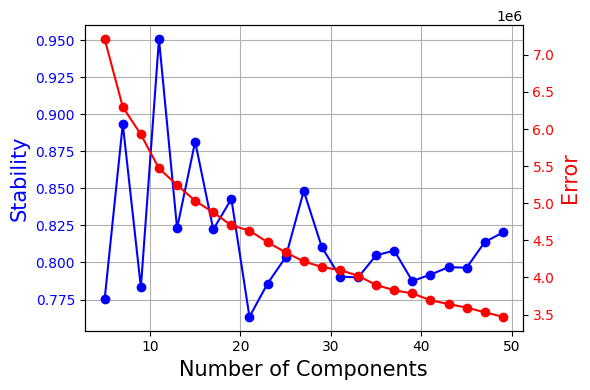

In [21]:
cnmf_obj.k_selection_plot(close_fig=False)

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/cnmf/cnmf.py:900: RuntimeWarning: invalid value encountered in divide
  norm_tpm = (np.array(tpm.X.todense()) - tpm_stats['__mean'].values) / tpm_stats['__std'].values


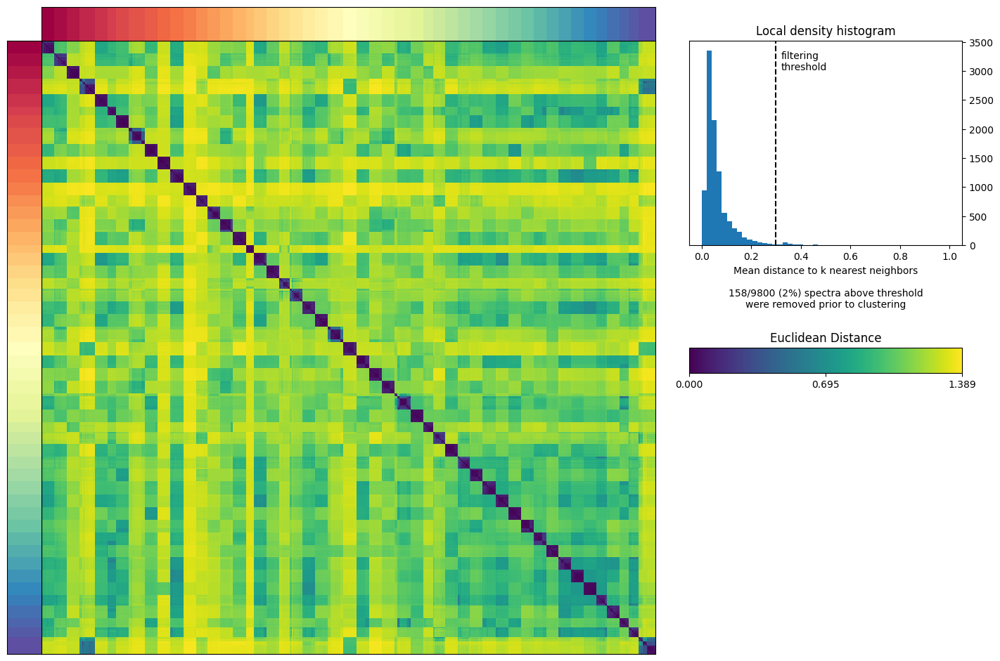

In [23]:
selected_K = 49
density_threshold = 0.3

cnmf_obj.consensus(k=selected_K, density_threshold=density_threshold, show_clustering=True, close_clustergram_fig=False)


/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/cnmf/cnmf.py:900: RuntimeWarning: invalid value encountered in divide
  norm_tpm = (np.array(tpm.X.todense()) - tpm_stats['__mean'].values) / tpm_stats['__std'].values


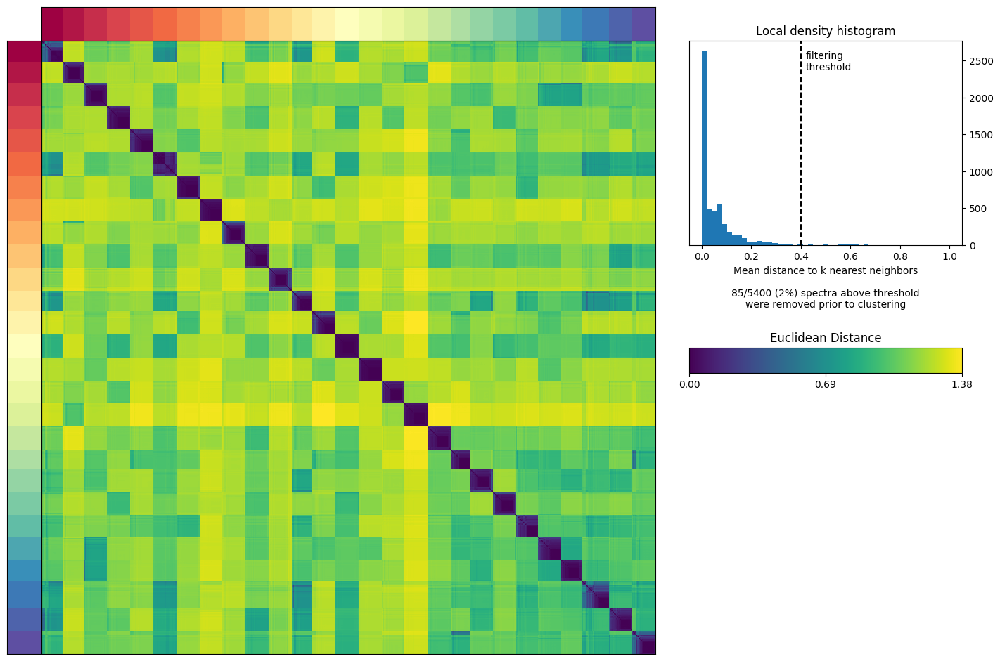

In [25]:
selected_K = 27
density_threshold = 0.4

cnmf_obj.consensus(k=selected_K, density_threshold=density_threshold, show_clustering=True, close_clustergram_fig=False)

/home/tadeoye/miniconda3/envs/scRNA_seq_meta_analysis/lib/python3.10/site-packages/cnmf/cnmf.py:900: RuntimeWarning: invalid value encountered in divide
  norm_tpm = (np.array(tpm.X.todense()) - tpm_stats['__mean'].values) / tpm_stats['__std'].values


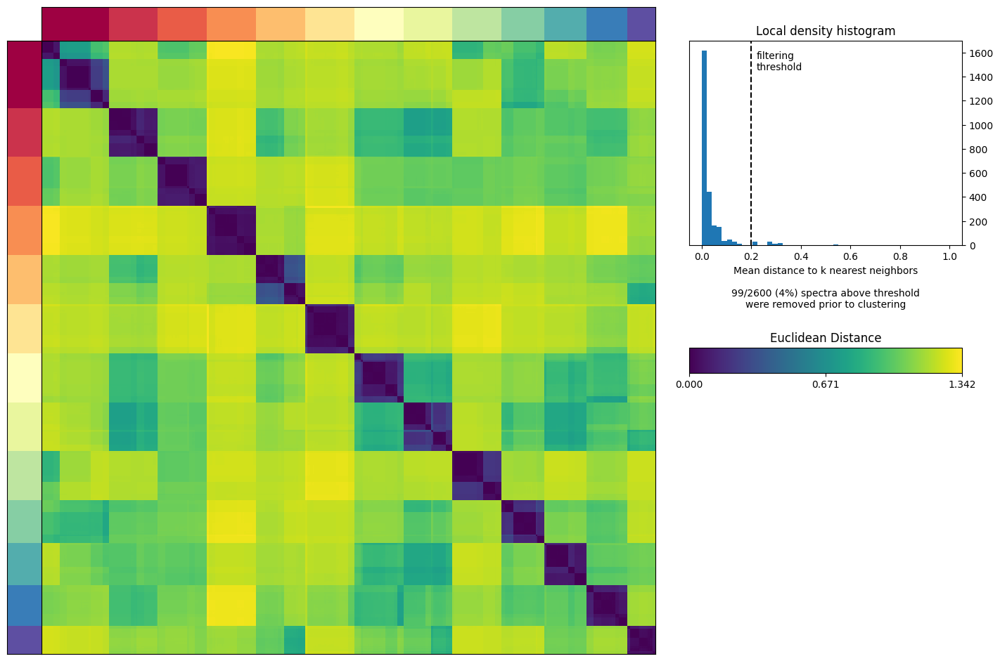

In [155]:
selected_K = 13
density_threshold = 0.2

cnmf_obj.consensus(k=selected_K, density_threshold=density_threshold, show_clustering=True, close_clustergram_fig=False)

normalizing by total count per cell
    finished (0:00:05): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


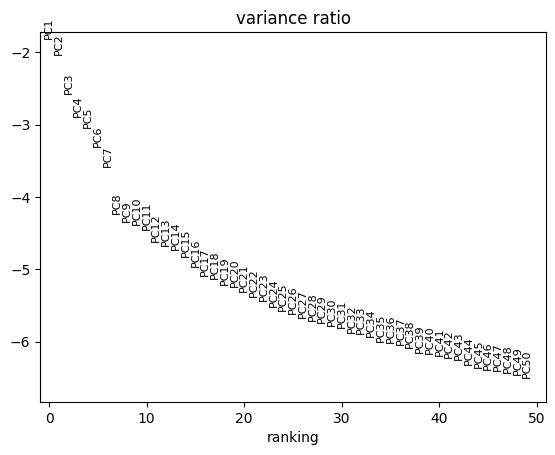

In [152]:
adata = sc.read(countfn)
adata.layers['counts'] = adata.X.copy()

## Obtain high variance genes that were used for cNMF as these were saved to a text file
hvgs = open(f'{output_directory}/{run_name}/{run_name}.overdispersed_genes.txt').read().split('\n')

sc.pp.normalize_per_cell(adata, counts_per_cell_after=10**4) ## TPT normalization

## Set log-normalized data to the raw attribute of the AnnData object to make it easy to plot expression levels of individual genes.
## This does not log normalize the actual AnnData data matrix
adata.raw = sc.pp.log1p(adata.copy(), copy=True)
sc.pp.log1p(adata)

## Subset out only the high-variance genes
# adata = adata[:, hvgs]

## Mean and variance normalize the genes
sc.pp.scale(adata)

## Run PCA
adata.var['highly_variable'] = [gene in hvgs for gene in adata.var_names]

sc.pp.pca(adata, use_highly_variable=True)

## Make a scree plot to determine number of PCs to use for UMAP

sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)


computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


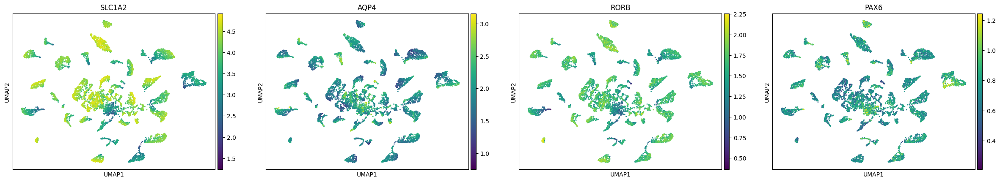

In [153]:
## Construct the nearest neighbor graph for UMAP

sc.pp.neighbors(adata)

## Run UMAP

sc.tl.umap(adata)

## Plot the UMAP with some cannonical marker genes to see that the apparent grouping makes sense
marker_genes = ['SLC1A2', 'AQP4', 'RORB', 'PAX6']
sc.pl.umap(adata, color=marker_genes,
           # use_raw=True, 
           ncols=len(marker_genes))

In [110]:
effect_sizes

,z_scores,logFC,pval,se,z_scores*pval,z_scores*sqrt_pval
gene_name,,,,,,
AL627309.1,1.515480,0.514836,0.887225,0.339718,1.344572,1.427471
AL627309.3,-1.996161,-1.809472,-1.338033,0.906476,-2.670929,-2.309027
AL627309.4,0.238917,0.568106,0.090888,2.377839,0.021715,0.072028
AP006222.2,0.409778,0.686646,0.166236,1.675653,0.068120,0.167075
AC114498.1,-0.653023,-0.708943,-0.289256,1.085632,-0.188891,-0.351212
...,...,...,...,...,...,...
AC011841.1,1.903189,1.725335,1.244004,0.906549,2.367574,2.122720
AC004556.3,1.184066,0.939700,0.626377,0.793621,0.741671,0.937117
AC171558.1,-0.948487,-1.587826,-0.464856,1.674061,-0.440910,-0.646682


In [156]:
selected_K = 13
density_threshold = 0.2

usage_norm, gep_scores, gep_tpm, topgenes = cnmf_obj.load_results(K=selected_K, density_threshold=density_threshold)
usage_norm.columns = ['Usage_%d' % i for i in usage_norm.columns]

adata.obs = pd.merge(left=adata.obs, right=usage_norm, how='left', left_index=True, right_index=True)


In [64]:
import numpy as np

def direct_projection(w, G, U):
    """
    Method 1: Direct Projection and Weighted Summation

    Parameters
    ----------
    w : numpy.ndarray
        A length-H array indicating pathway genes (e.g., binary).
    G : numpy.ndarray
        K x H array of consensus programs. Rows are programs, columns are genes.
    U : numpy.ndarray
        N x K array of program usage per cell. Rows are cells, columns are programs.

    Returns
    -------
    activity : numpy.ndarray
        Length-N array of pathway activity per cell.
    """
    # Normalize the pathway vector
    w_norm = w / (np.linalg.norm(w) + 1e-9)
    # Project w_norm onto program space
    p = w_norm @ G.T
    # Compute cell-level activity by combining p with U
    activity = U @ p
    return activity

def program_affinity(w, G, U):
    """
    Method 2: Gene-Weight Integration from the Programs

    Parameters
    ----------
    w : numpy.ndarray
        A length-H array indicating pathway membership (e.g., binary: 1 if gene is in the pathway).
    G : numpy.ndarray
        K x H array of consensus programs.
    U : numpy.ndarray
        N x K array of program usage per cell.

    Returns
    -------
    activity : numpy.ndarray
        Length-N array representing pathway activity per cell.
    """
    pathway_mask = (w > 0)
    denom = np.sum(pathway_mask) if np.sum(pathway_mask) > 0 else 1
    # Compute mean loading of pathway genes in each program
    program_affinity = G[:, pathway_mask].mean(axis=1) / denom

    # Weighted sum of U by these affinities
    activity = U @ program_affinity
    return activity


In [65]:
%%R -o gene_set -i curated_gene_set_db

source('../scripts/functions/PASBench/R/main.R')
source('../scripts/functions/helper_functions.r')

gene_set <- {}
for (gs in names(curated_gene_set_db)){
    gene_set[[gs]] <- read.geneset(curated_gene_set_db[[gs]]) 
}

Read 129 records
Read 8627 items
Read 215 records
Read 3223 items
Read 267 records
Read 4147 items
Read 7608 records
Read 645524 items
Read 1736 records
Read 101062 items
Read 186 records
Read 13167 items
Read 505 records
Read 258113 items
Read 610 records
Read 156411 items


In [157]:
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
from sklearn.preprocessing import MinMaxScaler

gene_gep_weights = gep_tpm.dropna(how='all')
gene_gep_weights = gene_gep_weights.loc[effect_sizes.index] 
gene_gep_weights = gene_gep_weights[gene_gep_weights.sum(axis=1)>0]
gene_gep_weights = gene_gep_weights.multiply(np.abs(effect_sizes['pval'].values), axis=0)

gene_set_name = 'gobp'

In [143]:
for pathway in gene_set[gene_set_name].keys():
    
    # Get indices of pathway genes in expression matrix
    pathway_genes_idx = gene_set[gene_set_name][pathway]
    pathway_gene_vector = [(gene in pathway_genes_idx) * 1 for gene in gene_gep_weights.index]
    gep_norm = gene_gep_weights.div(gene_gep_weights.sum(axis=1), axis=0).values.T
    
    if isinstance(usage_norm, pd.DataFrame):
        usage_norm_arr = usage_norm.values

    pathway_activity = direct_projection(pathway_gene_vector, gep_norm, usage_norm_arr)

    adata.obs[f'{pathway}_direct_projection'] = ''
    adata.obs[f'{pathway}_direct_projection'] = MinMaxScaler().fit_transform(pathway_activity.reshape(-1, 1))

In [158]:
# For each pathway P containing genes g
n_cells = adata.shape[0]
pathway_activity = np.zeros(n_cells)

for pathway in gene_set[gene_set_name].keys():

    # Get indices of pathway genes in expression matrix
    pathway_genes_idx = gene_set[gene_set_name][pathway]
    pathway_genes_idx = list(set(pathway_genes_idx) & set(gene_gep_weights.index))

    # Project pathway onto GEP components
    gep_pathway_scores = pd.DataFrame(gene_gep_weights.loc[pathway_genes_idx, :].sum(0))
    gep_pathway_scores = gep_pathway_scores.values.reshape(-1, 1)  # Convert to column vector

    # Weight usage matrix by pathway-GEP associations
    # Convert usage_norm to numpy if it's a pandas DataFrame
    usage_norm_arr = usage_norm.values

    # Calculate percentage of non-zero values in each column
    non_zero_percent = (usage_norm_arr > 0).mean(axis=0)

    # Get indices of columns to keep (where > 5% are non-zero)
    keep_cols = non_zero_percent > 0.05

    # Filter the array to keep only those columns
    usage_norm_arr = usage_norm_arr[:, keep_cols]
    gep_pathway_scores = gep_pathway_scores[keep_cols]

    pathway_activity = usage_norm_arr @ gep_pathway_scores

    adata.obs[f'{pathway}_projection'] = ''
    adata.obs[f'{pathway}_projection'] = MinMaxScaler().fit_transform(pathway_activity.reshape(-1, 1))

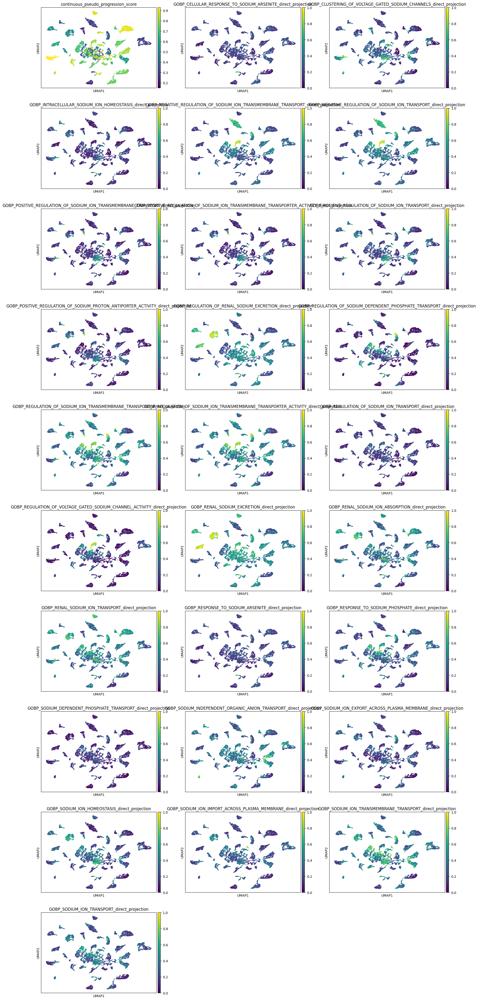

In [146]:
sodium_terms = [path+'_direct_projection' for path in gene_set['gobp'].keys() if 'SODIUM'in path]
sc.pl.umap(adata, color=[factor] + sodium_terms, ncols=3)

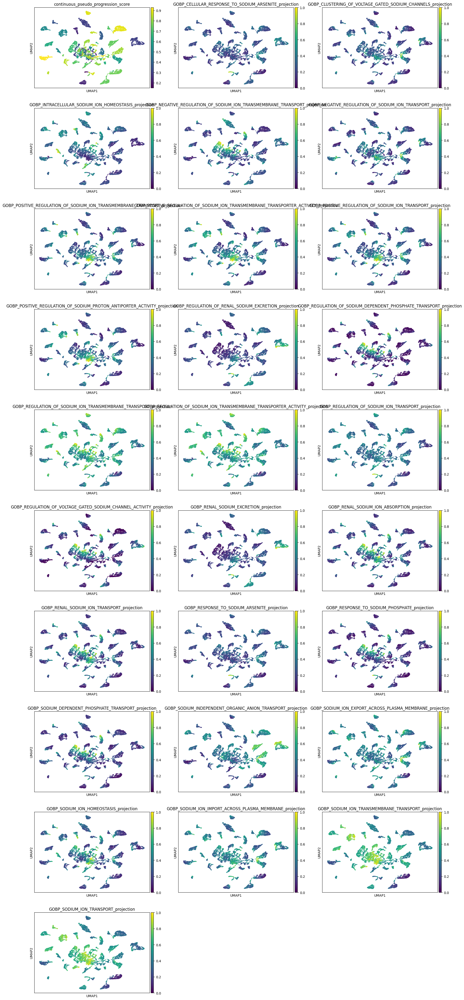

In [159]:
sodium_terms = [path+'_projection' for path in gene_set['gobp'].keys() if 'SODIUM'in path]
sc.pl.umap(adata, color=[factor] + sodium_terms, ncols=3)

In [137]:
gene_set[gene_set_name].keys()

('GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS',
 'GOBP_2FE_2S_CLUSTER_ASSEMBLY',
 'GOBP_2_OXOGLUTARATE_METABOLIC_PROCESS',
 'GOBP_3_PHOSPHOADENOSINE_5_PHOSPHOSULFATE_METABOLIC_PROCESS',
 'GOBP_3_UTR_MEDIATED_MRNA_DESTABILIZATION',
 'GOBP_3_UTR_MEDIATED_MRNA_STABILIZATION',
 'GOBP_4FE_4S_CLUSTER_ASSEMBLY',
 'GOBP_4_HYDROXYPROLINE_METABOLIC_PROCESS',
 'GOBP_5S_CLASS_RRNA_TRANSCRIPTION_BY_RNA_POLYMERASE_III',
 'GOBP_5_PHOSPHORIBOSE_1_DIPHOSPHATE_METABOLIC_PROCESS',
 'GOBP_7_METHYLGUANOSINE_CAP_HYPERMETHYLATION',
 'GOBP_7_METHYLGUANOSINE_RNA_CAPPING',
 'GOBP_ABSCISSION',
 'GOBP_ACETATE_ESTER_METABOLIC_PROCESS',
 'GOBP_ACETATE_ESTER_TRANSPORT',
 'GOBP_ACETYLCHOLINE_SECRETION',
 'GOBP_ACETYL_COA_BIOSYNTHETIC_PROCESS',
 'GOBP_ACETYL_COA_BIOSYNTHETIC_PROCESS_FROM_PYRUVATE',
 'GOBP_ACETYL_COA_METABOLIC_PROCESS',
 'GOBP_ACIDIC_AMINO_ACID_TRANSPORT',
 'GOBP_ACID_SECRETION',
 'GOBP_ACINAR_CELL_DIFFERENTIATION',
 'GOBP_ACROSOMAL_VESICLE_EXOCYTOSIS',
 'GOBP_ACROSOME_ASSEMBLY',
 'GOBP_ACROSOME_R

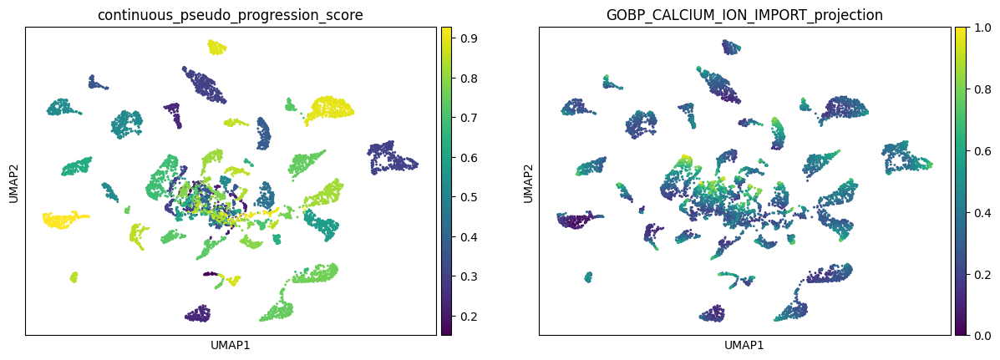

In [160]:
sc.pl.umap(adata, color=['continuous_pseudo_progression_score', 'GOBP_CALCIUM_ION_IMPORT_projection'])

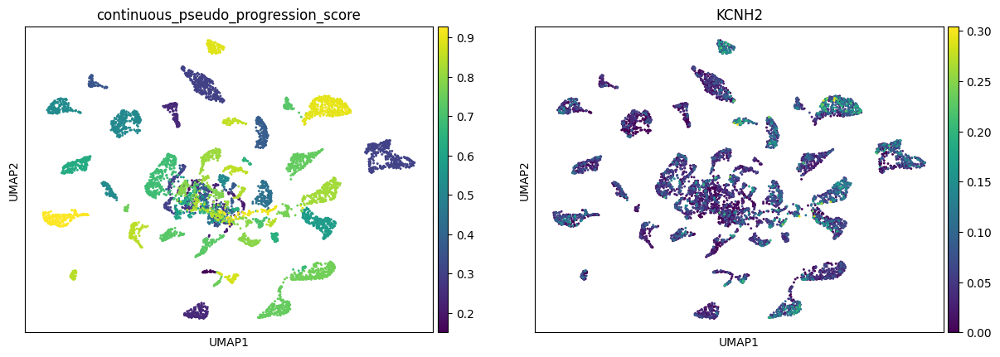

In [172]:
sc.pl.umap(adata, color=['continuous_pseudo_progression_score', 'KCNH2'])

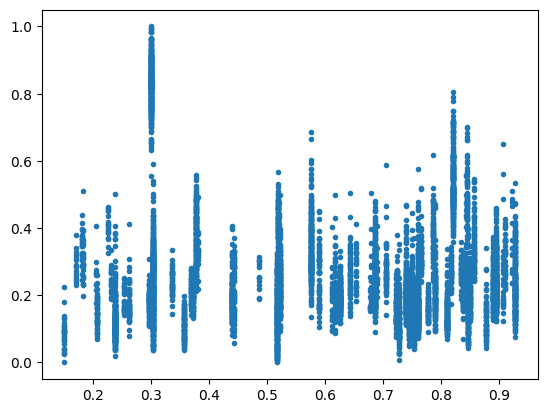

In [151]:
plt.plot(adata.obs['continuous_pseudo_progression_score'],
         adata.obs['GOBP_SYNAPSE_PRUNING_projection'], '.')

In [ ]:

gene_gep_weights = gep_tpm.dropna(how='all')
gene_gep_weights = gene_gep_weights[gene_gep_weights.sum(axis=1)>0]

for pathway in gb_gmt['Gene set'].values:
    
    # Get indices of pathway genes in expression matrix
    pathway_genes_idx = gb_gmt.loc[gb_gmt['Gene set']==pathway, 'Gene'].values.tolist()[0]
    pathway_gene_vector = [(gene in pathway_genes_idx) * 1 for gene in gene_gep_weights.index]
    gep_norm = gene_gep_weights.div(gene_gep_weights.sum(axis=1), axis=0).values.T
    
    if isinstance(usage_norm, pd.DataFrame):
        usage_norm_arr = usage_norm.values

    pathway_activity = program_affinity(pathway_gene_vector, gep_norm, usage_norm_arr)

    adata.obs[f'{pathway}_program_affinity'] = ''
    adata.obs[f'{pathway}_program_affinity'] = pathway_activity

In [ ]:
# For each pathway P containing genes g
n_cells = adata.shape[0]
pathway_activity = np.zeros(n_cells)

for pathway in gb_gmt['Gene set'].values:

    # Get indices of pathway genes in expression matrix
    pathway_genes_idx = gb_gmt.loc[gb_gmt['Gene set']==pathway, 'Gene'].values.tolist()[0]
    pathway_genes_idx = list(set(pathway_genes_idx) & set(gep_scores.index))
    # Project pathway onto GEP components
    gep_pathway_scores = pd.DataFrame(gep_tpm.loc[pathway_genes_idx, :].sum(0))
    gep_pathway_scores = gep_pathway_scores.values.reshape(-1, 1)  # Convert to column vector

    # Weight usage matrix by pathway-GEP associations
    # Convert usage_norm to numpy if it's a pandas DataFrame
    if isinstance(usage_norm, pd.DataFrame):
        usage_norm_arr = usage_norm.values

    pathway_activity = usage_norm_arr @ gep_pathway_scores

    adata.obs[f'{pathway}_projection'] = ''
    adata.obs[f'{pathway}_projection'] = pathway_activity

/tmp/ipykernel_433346/2820035262.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f'{pathway}_projection'] = ''
/tmp/ipykernel_433346/2820035262.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f'{pathway}_projection'] = ''
/tmp/ipykernel_433346/2820035262.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fr

In [271]:
for pathway in gb_gmt['Gene set'].values:

    # Get indices of pathway genes in expression matrix
    pathway_genes_idx = gb_gmt.loc[gb_gmt['Gene set']==pathway, 'Gene'].values.tolist()[0]
    pathway_genes_idx = list(set(pathway_genes_idx) & set(gep_scores.index))
    
    # Get pathway gene loadings across GEPs
    gene_gep_weights = gep_tpm.loc[pathway_genes_idx, :].dropna(how='all')
    gene_gep_weights = gene_gep_weights[gene_gep_weights.sum(axis=1)>0]

    # Normalize weights
    gene_gep_weights = gene_gep_weights.div(gene_gep_weights.sum(axis=1), axis=0)
    # gene_gep_weights = gene_gep_weights.values.reshape(-1, 1) 

    # Weight pathway genes by their GEP contributions
    expression_array = adata[:, gene_gep_weights.index].layers['counts'].toarray()
    weighted_expression = expression_array @ gene_gep_weights.to_numpy()

    # Get final pathway activity
    pathway_activity = np.sum(weighted_expression * usage_norm_arr, axis=1)

    adata.obs[f'{pathway}_loadings'] = ''
    adata.obs[f'{pathway}_loadings'] = pathway_activity

/tmp/ipykernel_433346/1250386181.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f'{pathway}_loadings'] = ''
/tmp/ipykernel_433346/1250386181.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f'{pathway}_loadings'] = ''
/tmp/ipykernel_433346/1250386181.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame,

In [ ]:
%%R -o gene_set -i curated_gene_set_db -o activity_summary

library(MAYA)
source('../scripts/functions/PASBench/R/main.R')
source('../scripts/functions/helper_functions.r')

gene_set <- {}
for (gs in names(curated_gene_set_db)){
    gene_set[[gs]] <- read.geneset(curated_gene_set_db[[gs]]) 
}

# for each module, stores activity scores (raw or scaled between 0 and 1) from informative PCs, 
# gene contributions to each informative PC,
# variance explained by each PC, threshold used for informativity and number of cells above threshold.

# List matrix of average score by Leiden cluster and pathway used for attribution, 
# cell annotation with Leiden clusters, activity matrix and UMAP computed on activity matrix.

activity_summary <- MAYA_pathway_analysis(
    expr_mat=counts(summed_counts_per_celltype[['Astrocyte']]), # Raw count matrix. If normalized, set is_logcpm to T
    modules_list = gene_set[['gobp']], # List with pathways associated with their genes. Can also set to "hallmark" or "kegg" to load corresponding MSigDB lists.
    min_cells_pct = 0.05,   # Numeric between 0 and 1, minimum percentage of cells that should be above informativity threshold to consider activity score interesting.
    is_logcpm = F,          # Set to TRUE if data already normalized
    nCores = 40,            # Number of cores to use. Set to 1 if working in a Windows environment, otherwise you can use the function detectCores() to find out how many cores are available.
    max_contrib = 0.5,      # Numeric between 0 and 1, representing the maximum contribution to a PC allowed for a gene. Can influence how stringent mode selection is.
    compute_umap = T, 
    scale_before_pca = T,
    all_PCs_in_range = F
    )


activity_summary[['cluster_matrix']] <- as.data.frame(activity_summary[['cluster_matrix']])
activity_summary[['activity_matrix']] <- as.data.frame(activity_summary[['activity_matrix']])

Loading required package: umap
Loading required package: RANN
Loading required package: pheatmap
Loading required package: wesanderson
Loading required package: leidenbase
Read 129 records
Read 8627 items
Read 215 records
Read 3223 items
Read 267 records
Read 4147 items
Read 7608 records
Read 645524 items
Read 1736 records
Read 101062 items
Read 186 records
Read 13167 items
Read 505 records
Read 258113 items
Read 610 records
Read 156411 items
Running pathway analysis
Computing gene sets activity
Found at least one informative activation mode for 777 gene sets
In addition: Warning messages:
1: replacing previous import ‘dplyr::as_data_frame’ by ‘igraph::as_data_frame’ when loading ‘MAYA’ 
2: replacing previous import ‘dplyr::groups’ by ‘igraph::groups’ when loading ‘MAYA’ 
3: replacing previous import ‘dplyr::union’ by ‘igraph::union’ when loading ‘MAYA’ 


In [19]:
%%R
#' ComputeModuleEigengene
#'
#' Internal helper function that computes module eigengene for a single module.
#'
#' @param seurat_obj A Seurat object
#' @param cur_mod name of a module found in seurat_obj@misc[[seurat_obj@misc$active_wgcna]]$wgcna_net$colors
#' @param modules table containing module / gene assignments, as in GetModules(seurat_obj).
#' @param group.by.vars groups to harmonize by
#' @param verbose logical indicating whether to print messages
#' @param vars.to.regress character vector of variables in seurat_obj@meta.data to regress when running ScaleData
#' @param scale.model.use model to scale data when running ScaleData choices are "linear", "poisson", or "negbinom"
#' @param pc_dim Which PC to use as the module eigengene? Default to 1.
#' @param assay Assay in seurat_obj to compute module eigengenes. Default is DefaultAssay(seurat_obj)
#' @param wgcna_name name of the WGCNA experiment
#' @import Seurat
#' @import harmony
ComputeModuleEigengene2 <- function(
  seurat_obj,
  cur_mod,
  modules,
  group.by.vars=NULL,
  verbose=TRUE,
  vars.to.regress = NULL,
  scale.model.use = 'linear',
  pc_dim = 1,
  assay = NULL,
  wgcna_name=NULL, ...
){

  # set as active assay if wgcna_name is not given
  if(is.null(wgcna_name)){wgcna_name <- seurat_obj@misc$active_wgcna}

  # get the assay
  if(is.null(assay)){assay <- DefaultAssay(seurat_obj)}

  # get genes in this module:
  cur_genes <- modules %>% subset(module == cur_mod) %>% .$gene_name %>% as.character()

  # get the expression matrix:
  if(CheckSeurat5()){
    X <- SeuratObject::LayerData(seurat_obj, layer='counts', assay=assay)[cur_genes,]
    X_dat <- SeuratObject::LayerData(seurat_obj, layer='data', assay=assay)[cur_genes,]
  } else{
    X <- Seurat::GetAssayData(seurat_obj, slot='counts', assay=assay)[cur_genes,]
    X_dat <- Seurat::GetAssayData(seurat_obj, slot='data', assay=assay)[cur_genes,]
  }

  # create seurat obj with just these genes
  cur_seurat <- CreateSeuratObject(X, assay = assay, meta.data = seurat_obj@meta.data)
  
  if(CheckSeurat5()){
    result <- try(cur_seurat <- SetAssayData(cur_seurat, layer='data', new.data=X_dat, assay=assay), silent=TRUE)
    if("Seurat" %in% class(result)){
      cur_seurat <- result
    } else{
        cur_seurat <- SetAssayData(cur_seurat, slot='data', new.data=X_dat, assay=assay)
    }
  } else{
    cur_seurat <- SetAssayData(cur_seurat, slot='data', new.data=X_dat, assay=assay)
  }

  # scale the subsetted expression dataset:
  if(is.null(vars.to.regress)){
    cur_seurat <- ScaleData(cur_seurat, features=rownames(cur_seurat), model.use=scale.model.use)
  } else if(all(vars.to.regress %in% colnames(seurat_obj@meta.data))){
    cur_seurat <- ScaleData(cur_seurat, features=rownames(cur_seurat), model.use=scale.model.use, vars.to.regress=vars.to.regress)
  } else{
    stop(paste0("Some variables specified in vars.to.regress are not found in seurat_obj@meta.data"))
  }

  # compute average expression of each gene
  if(CheckSeurat5()){
    cur_expr <- SeuratObject::GetAssayData(cur_seurat, layer='data')
  } else{
    cur_expr <- Seurat::GetAssayData(cur_seurat, slot='data')
  }
  expr <- Matrix::t(cur_expr)
  averExpr <- Matrix::rowSums(expr) / ncol(expr)

  # run PCA with Seurat function
  cur_pca <- Seurat::RunPCA(
    cur_seurat,
    features = cur_genes,
    reduction.key=paste0('pca', cur_mod),
    verbose=verbose, ...
  )@reductions$pca
  pc <- cur_pca@cell.embeddings[,pc_dim]
  pc_loadings <- cur_pca@feature.loadings[,pc_dim]

  # correlate average expression with eigengene
  pca_cor <- cor(averExpr, pc)

  # run harmony
  if(!is.null(group.by.vars)){

    # add this PCA as its own reduction in the seurat object
    seurat_obj@reductions$ME <- Seurat::CreateDimReducObject(
      embeddings = cur_pca@cell.embeddings,
      assay = assay
    )

    cur_harmony <- harmony::RunHarmony(
      seurat_obj,
      group.by.vars=group.by.vars,
      reduction.use="ME", verbose=verbose, assay.use=assay, ...
    )@reductions$harmony
    ha <- cur_harmony@cell.embeddings[,pc_dim]
    ha_loadings <- cur_pca@feature.loadings[,pc_dim]

    if(pca_cor < 0){
      cur_harmony@cell.embeddings[,pc_dim] <- -ha
      ha_loadings <- -ha_loadings
    }

    # add harmonized PCA as its own reduction in the seurat object
    seurat_obj@reductions$ME_harmony <- Seurat::CreateDimReducObject(
      embeddings = cur_harmony@cell.embeddings,
      assay = assay
    )

    seurat_obj <- SetMELoadings(
      seurat_obj,
      loadings=ha_loadings,
      harmonized=TRUE,
      wgcna_name=wgcna_name
    )

  }

  if(pca_cor < 0){
    cur_pca@cell.embeddings[,pc_dim] <- -pc
    pc_loadings <- -pc_loadings
  }

  # add this PCA as its own reduction in the seurat object
  seurat_obj@reductions$ME <- Seurat::CreateDimReducObject(
    embeddings = cur_pca@cell.embeddings,
    assay = assay
  )

  seurat_obj <- SetMELoadings(
    seurat_obj,
    loadings=pc_loadings,
    harmonized=FALSE,
    wgcna_name=wgcna_name
  )

  # return seurat object
  seurat_obj

}

#' ModuleEigengenes
#'
#' Computes module eigengenes for co-expression modules
#'
#' @return seurat_obj with the module eigengenes computed for the selected wgcna experiment
#'
#' @param seurat_obj A Seurat object
#' @param modules table containing module / gene assignments, as in GetModules(seurat_obj).
#' @param group.by.vars groups to harmonize by
#' @param verbose logical indicating whether to print messages
#' @param vars.to.regress character vector of variables in seurat_obj@meta.data to regress when running ScaleData
#' @param scale.model.use model to scale data when running ScaleData choices are "linear", "poisson", or "negbinom"
#' @param pc_dim Which PC to use as the module eigengene? Default to 1.
#' @param assay Assay in seurat_obj to compute module eigengenes. Default is DefaultAssay(seurat_obj)
#' @param wgcna_name name of the WGCNA experiment
#'
#' @details
#' ModuleEigengenes summarizes the gene expression signatures of entire co-expression
#' modules. This is done by performing singular value decomposition (SVD) on a
#' subset of the scaled expression matrix containing only features assigned to each module.
#' The module eigengene (ME), defined as the first dimension of the SVD matrix, retains the most variation, and we use
#' this vector as a summary of gene expression for the whole module.
#'
#' The module gene expression matrix is first scaled using the Seurat ScaleData
#' function. The user can optionally adjust for covariates of interest in this step using the
#' vars.to.regress parameter. Additionally, the module eigengenes themselves can
#' be adjusted for technical biases such as sequencing batch, dataset of origin,
#' or other factors using the Harmony algorithm with the group.by.vars parameter.
#'
#' @import Seurat
#' @export
ModuleEigengenes2 <- function(
  seurat_obj,
  group.by.vars=NULL,
  modules=NULL,
  vars.to.regress = NULL,
  scale.model.use = 'linear',
  verbose=TRUE,
  assay = NULL,
  pc_dim = 1,
  wgcna_name=NULL, ...
){

  # set as active assay if wgcna_name is not given
  if(is.null(wgcna_name)){wgcna_name <- seurat_obj@misc$active_wgcna}
  CheckWGCNAName(seurat_obj, wgcna_name)
   
  # are we going to run Harmony?
  harmonized <- !is.null(group.by.vars)

  if(harmonized & !any(grepl("ScaleData", seurat_obj@commands))){
      stop('Need to run ScaleData before running ModuleEigengenes with group.by.vars option.')
  }

  # get the assay
  if(is.null(assay)){assay <- DefaultAssay(seurat_obj)}

  me_list <- list()
  harmonized_me_list <- list()

  # re-set feature loadings:
  seurat_obj <- SetMELoadings(
    seurat_obj,
    loadings=c(""),
    harmonized=FALSE,
    wgcna_name=wgcna_name
  )
  if(harmonized){
    seurat_obj <- SetMELoadings(
      seurat_obj,
      loadings=c(""),
      harmonized=TRUE,
      wgcna_name=wgcna_name
    )
  }

  # get modules from Seurat object, else use provided modules
  if(is.null(modules)){
    modules <- GetModules(seurat_obj, wgcna_name)
    projected <- FALSE
  } else{
    projected <- TRUE
  }

  # get list of modules:
  mods <- levels(modules$module)
  mods_loop <- mods

  # loop over modules:
  for(cur_mod in mods_loop){

    # print(cur_mod)

    # compute module eigengenes for this module
    seurat_obj <- ComputeModuleEigengene2(
      seurat_obj = seurat_obj,
      cur_mod = cur_mod,
      modules=modules,
      group.by.vars=group.by.vars,
      vars.to.regress = vars.to.regress,
      scale.model.use = scale.model.use,
      verbose=verbose,
      pc_dim = pc_dim,
      assay = assay,
      wgcna_name=wgcna_name,
      ...
    )

    # add module eigengene to ongoing list
    cur_me <- seurat_obj@reductions$ME@cell.embeddings[,pc_dim]
    me_list[[cur_mod]] <- cur_me

    # run harmony
    if(harmonized){
      # add module eigengene to ongoing list
      cur_harmonized_me <- seurat_obj@reductions$ME_harmony@cell.embeddings[,pc_dim]
      harmonized_me_list[[cur_mod]] <- cur_harmonized_me
    }
  }

  # merge module eigengene lists into a dataframe, order modules, add to Seurat obj
  me_df <- do.call(cbind, me_list)
  if(!projected){me_df <- WGCNA::orderMEs(me_df)}
  seurat_obj <- SetMEs(seurat_obj, me_df, harmonized=FALSE, wgcna_name)

  # merge harmonized module eigengene lists into a dataframe, add to Seurat obj
  if(!is.null(group.by.vars)){
    hme_df <- do.call(cbind, harmonized_me_list)
    if(!projected){hme_df <- WGCNA::orderMEs(hme_df)}
    seurat_obj <- SetMEs(seurat_obj, hme_df, harmonized=TRUE, wgcna_name)
  }
  
  # set module factor levels based on order
  MEs <- GetMEs(seurat_obj, harmonized, wgcna_name)
  modules$module <- factor(
    as.character(modules$module),
    levels=mods
  )
  seurat_obj <- SetModules(seurat_obj, modules, wgcna_name)

  # remove temp dim reductions by setting to NULL
  seurat_obj@reductions$ME <- NULL
  seurat_obj@reductions$ME_harmony <- NULL

  # return seurat object
  seurat_obj
}


In [81]:
sce_obj['Astrocyte']

AnnData object with n_obs × n_vars = 6896 × 36601
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'donor_id', 'cells_merged', 'Subclass', 'ident', 'method', 'continuous_pseudo_progression_score', 'age_at_death_binned_codes', 'sex', 'race_choice_white', 'genes_detected', 'number_of_umis', 'pmi', 'apoe4_status'
    obsm: 'pa_scores', 'hpa_scores'
    layers: 'logcounts'

In [82]:
MEs['Astrocyte'].columns

Index(['Remyelination', 'Transcription factors-Pou', 'Phosphorylation-TK',
       'Phospholipid metabolism', 'Transcription factors-HMG',
       'Transcription factors-THAP', 'Transcription factors-MYB',
       'Transcription factors-Others', 'Ubiquitination-E3-HECT-Other',
       'Transcription factors-DM', 'Fc receptors and MHCII',
       'Transcription factors-zf-BED', 'Transcription factors-MBD',
       'Transcription factors-HSF', 'Glycolytic enzymes',
       'Cholesterol biosynthesis', 'Steroid metabolism',
       'Transcription factors-bHLH', 'Transcription machinery',
       'Ubiquitination-E1E2', 'Ubiquitin', 'Translation factors',
       'Electron transport chain components', 'Ribosomal proteins',
       'Transcription factors-IRF', 'Transcription factors-CSD',
       'Ubiquitination-E3-RING-Complex-CRLs-ECS', 'Sphingolipid metabolism',
       'Interferon stimulated genes', 'Transcription factors-TF_bZIP',
       'Transcription factors-E2F', 'Transcription factors-CP2',
     

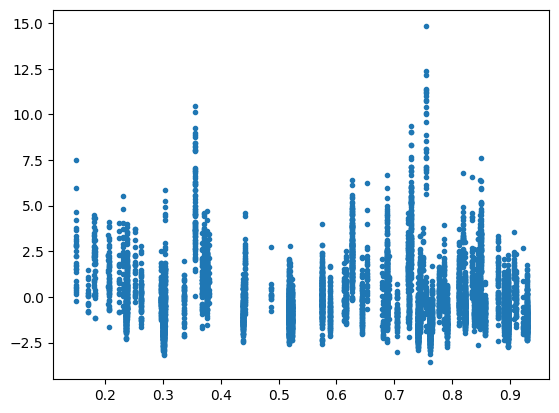

In [88]:
plt.plot(sce_obj['Astrocyte'].obs['continuous_pseudo_progression_score'],
         MEs['Astrocyte']['Cholesterol biosynthesis'],
         '.')

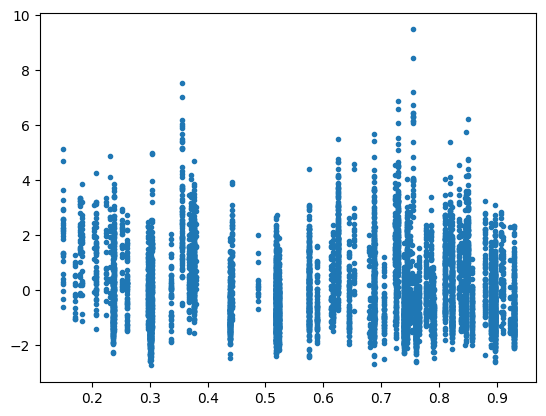

In [87]:
plt.plot(sce_obj['Astrocyte'].obs['continuous_pseudo_progression_score'],
         hMEs['Astrocyte']['Cholesterol biosynthesis'],
         '.')


In [79]:
%%R -i cell_type_column -i normalize_AUCell -i max_set_size -i min_set_size -i kcdf -i maxDiff -i curated_gene_set_db -i pas_methods -i n_cores -i normalization_methods -o gene_set -o sce_obj -o MEs -o hMEs


source('../scripts/functions/PASBench/R/main.R')
source('../scripts/functions/helper_functions.r')

conflicts_prefer(GenomicRanges::intersect)
conflicts_prefer(WGCNA::cor)

gene_set <- read.geneset(curated_gene_set_db[['gabitto']])

seurat_obj <- list()
sce_obj <- list()
MEs <- list()
hMEs <- list()

for(cell_type in unique(colData(adata_merged)[[cell_type_column]])){
    if(!(cell_type %in% c('Endothelial', 'VLMC'))) {

    sce <- adata_merged[, colData(adata_merged)[[cell_type_column]] == cell_type]
    seurat_obj[[cell_type]] <- as.Seurat(sce, counts = "X", data = "X")

    filtered_pathways <- filter_genesets(
        expressed_genes_per_celltype[[cell_type]], 
        gene_set, 
        pathway_gene_threshold = 0.33,
        min_genes = 5, 
        max_genes = Inf
    )

    seurat_obj[[cell_type]] <- SetupForWGCNA(
        seurat_obj[[cell_type]],
        gene_select = "custom",                                 # the gene selection approach
        gene_list = expressed_genes_per_celltype[[cell_type]],  # list of genes to be included
        group.by = cell_type_column,                            # grouping parameter
        wgcna_name = cell_type                                  # the name of the hdWGCNA experiment
    )

    # seurat_obj[[cell_type]] <- SetMetacellObject(
    #     seurat_obj[[cell_type]], 
    #     metacell_obj=seurat_obj[[cell_type]], 
    #     wgcna_name=cell_type
    #     )

    seurat_obj[[cell_type]] <- SetModules(
        seurat_obj[[cell_type]], 
        modules = convert_pathway_list_to_df(filtered_pathways),
        wgcna_name = cell_type
        )
        
    seurat_obj[[cell_type]] <- NormalizeData(seurat_obj[[cell_type]])   
    seurat_obj[[cell_type]] <- FindVariableFeatures(seurat_obj[[cell_type]])
    seurat_obj[[cell_type]] <- ScaleData(seurat_obj[[cell_type]], features=VariableFeatures(seurat_obj[[cell_type]]))

    seurat_obj[[cell_type]] <- ModuleEigengenes2(
        seurat_obj[[cell_type]],
        group.by.vars = subject_id, 
        wgcna_name = cell_type
        )

    MEs[[cell_type]] <- GetMEs(seurat_obj[[cell_type]], harmonized=FALSE, wgcna_name = cell_type)
    hMEs[[cell_type]] <- GetMEs(seurat_obj[[cell_type]], harmonized=TRUE, wgcna_name = cell_type)

    sce_obj[[cell_type]] <- as.SingleCellExperiment(seurat_obj[[cell_type]])

    reducedDim(sce_obj[[cell_type]], 'pa_scores') <- as.matrix(MEs[[cell_type]])
    reducedDim(sce_obj[[cell_type]], 'hpa_scores') <- as.matrix(hMEs[[cell_type]])
    }
}

[conflicted] Removing existing preference.
[conflicted] Will prefer GenomicRanges::intersect over any other package.
[conflicted] Removing existing preference.
[conflicted] Will prefer WGCNA::cor over any other package.


Read 129 records
Read 8627 items
Performing log-normalization
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
Calculating gene variances
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
Calculating feature variances of standardized and clipped values
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
Centering and scaling data matrix
  |======================================================================| 100%
Centering and scaling data matrix
  |======================================================================| 100%
pcaActincytoskeleton_ 1 
Positive:  ACTG1, ARPC5L, ENC1, TMSB4X, CFL1, PFN2, KLHL28, PLEKHB2, ARPC5, KLHL34 
	   ACTR1B, ACTR2, ACTB, CAPZA2,

#### **Output Structure**
The implemented algorithms generates two complementary data structures:

1. A dictionary containing pathway activity scores for each gene set and method defined in `curated_gene_set_db`
2. A SingleCellExperiment object encoding a matrix of pathway activity scores (PAS) across cell types, where:
   - Rows represent individual pathways
   - Columns represent distinct cell types
   - Matrix elements contain non-/normalized PAS

The SingleCellExperiment object maintains the relationship between PAS and cellular identities while preserving the original experimental design structure. This allows us to perform downstream analysis on activuty scores like clustering and visualizing PAS in cellular populations.

In [ ]:
%%R -i cell_type_column -i normalize_AUCell -i max_set_size -i min_set_size -i kcdf -i maxDiff -i assay_name -i curated_gene_set_db -i pas_methods -i n_cores -i normalization_methods -o pas_scores -o pas_object

source('../scripts/functions/PASBench/R/main.R')
source('../scripts/functions/helper_functions.r')


pas_scores = list()
pas_object = list()
gene_sets <- curated_gene_set_db

for (gs in names(gene_sets)){
    pas_scores[[gs]] <- list()
    pas_object[[gs]] <- list()

    all_gs_genes <- unique(unlist(read.geneset(gene_sets[[gs]])))
    current_genes <- rownames(adata_merged)
    genes_to_keep <- current_genes %in% all_gs_genes

    for (method in pas_methods){
        
        if (method == 'GSVA'){
            sce <- assay(adata_merged[genes_to_keep, ], assay_name)
        }else{
            sce <- assay(adata_merged[genes_to_keep, ], 'X')
        }

        # run PAS scoring
        print(paste0("Estimating Activity Scores of ", gs, " Pathways using ", method, " scoring method"))
        print("........")

        res <- calculate_PAS(
            sce,
            method,                         # tool name
            species = 'none',               # species; human or mouse
            pathway = 'none',               # abbreviation for pathway database
            gmt_file = gene_sets[[gs]],     # pathways in GMT format
            filter = F,                     # whether filtering for genes expressed in less than 5 percent cells
            gsvaPar = list(                 # Parameters for when method selected is GSVA
                maxDiff = as.logical(maxDiff), 
                kcdf = kcdf, 
                minSize = min_set_size, 
                maxSize = max_set_size
                ),
            AUCellpar = list(normAUC=as.logical(normalize_AUCell)),
            normalize = normalization_methods[[method]],
            n_cores = n_cores,
            rand_seed = 12345
        )

        pas_scores[[gs]][[method]] <- as.data.frame(res)
        pas_object[[gs]][[method]] <- as.SingleCellExperiment(prepare_vis(pas_scores[[gs]][[method]]))

        colData(pas_object[[gs]][[method]]) <- DataFrame(
                merge(as.data.frame(colData(pas_object[[gs]][[method]])), 
                    as.data.frame(colData(adata_merged)), 
                    by=0, 
                    row.names=1)
        )
        rownames(colData(pas_object[[gs]][[method]])) <- colData(pas_object[[gs]][[method]])$Row.names   
    }
}

[1] "Estimating Activity Scores of gabitto Pathways using GSVA scoring method"
[1] "........"
Do not filter genes.
[1] "normalize error"
Setting parallel calculations through a MulticoreParam back-end with workers=40 and tasks=100.
Estimating GSVA scores for 76 gene sets.
Estimating ECDFs with Gaussian kernels
  |===========================================================           |  84%

#### **Save Pathway Activity Scores**

In [39]:
%%R

if (!dir.exists(paste0(data_dir, "results/PAS/"))) {
  dir.create(paste0(data_dir, "results/PAS/"))
}

saveRDS(pas_object, paste0(data_dir, "results/PAS/", "all_PAS.rds"))

In [41]:
for gs in curated_gene_set_db.names:
    for method in pas_methods:
        pas_object[gs][method].write_h5ad(os.path.join(data_dir,  "results", "PAS", f"{gs}_geneset_{method}_PAS.h5ad"),
                              compression='gzip')